In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an
from matplotlib import pyplot as plt

In [2]:
#adata=sc.read(results_file_post)
#adata.uns['log1p'] = {"base":None}

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.3 anndata==0.10.7 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 python-igraph==0.10.4 pynndescent==0.5.12


In [4]:
#%matplotlib inline

In [5]:
writeDir = "write/"

fileName = "Kürten2021_Head-and-Neck"

resultsFileQC = writeDir + fileName + '_QC.h5ad' 


In [6]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=150, fontsize=10, format='png')
sc.settings.figdir = "figures/" + fileName + "/"
figName = fileName

# Read In Data

In [7]:
inDir = f'data/{fileName}'

inputGenesFile = f'{inDir}/Genes.txt'
genes =  pd.read_table(inputGenesFile, delimiter=",", index_col=0, header=None)
genes.index.names = ['genes']
genes

""
genes
MIR1302-2HG
FAM138A
OR4F5
AL627309.1
AL627309.3
...
HPV_E5
HPV_L2
HPV_L1


In [8]:
def readAdata(inDir, sufix, genes):
    print(sufix)
    inputCellsFile = f'{inDir}/Cells{sufix}.csv'
    inputMtxFile = f'{inDir}/Exp_data_UMIcounts{sufix}.mtx'

    cells =  pd.read_table(inputCellsFile, delimiter=",", index_col=0)

    
    adata = sc.read_mtx(inputMtxFile).T
    
    adata.obs = cells
    adata.var = genes
    
    adata.var_names_make_unique()
    adata.obs_names_make_unique()
    adata = adata[adata.obs.cell_type=="Malignant"]
    return(adata)

readAdata(inDir,"",genes)

View of AnnData object with n_obs × n_vars = 11400 × 33545
    obs: 'sample', 'patient', 'cell_type', 'cell_subtype', 'complexity', 'umap1', 'umap2', 'g1s_score', 'g2m_score', 'cell_cycle_phase', 'mp_top_score', 'mp_top', 'mp_assignment', 'hpv', 'hpv_score'

In [9]:
adata = readAdata(inDir,"",genes)
adata

View of AnnData object with n_obs × n_vars = 11400 × 33545
    obs: 'sample', 'patient', 'cell_type', 'cell_subtype', 'complexity', 'umap1', 'umap2', 'g1s_score', 'g2m_score', 'cell_cycle_phase', 'mp_top_score', 'mp_top', 'mp_assignment', 'hpv', 'hpv_score'

In [10]:
inMetaFile = f'{inDir}/Meta-data.csv'
meta =  pd.read_table(inMetaFile, delimiter=",", index_col=0, header=0)
meta

,patient,n_cells,technology,cancer_type,sex,age,smoking_status,PY,diagnosis_recurrence,disease_extent,...,targeted_rx_response,ICB_exposed,ICB_response,ET_exposed,ET_response,time_end_of_rx_to_sampling,post_sampling_rx_exposed,post_sampling_rx_response,PFS_DFS,OS
sample,,,,,,,,,,,,,,,,,,,,,
GSM5017022_HN01_CD45p,HN01,2168,10X,Head and Neck Squamous Cell Carcinoma,M,70-79,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017023_HN01_CD45n,HN01,4174,10X,Head and Neck Squamous Cell Carcinoma,M,70-79,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017025_HN02_CD45p,HN02,474,10X,Head and Neck Squamous Cell Carcinoma,F,60-69,NO,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017027_HN03_CD45p,HN03,654,10X,Head and Neck Squamous Cell Carcinoma,M,80-89,NO,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017029_HN04_CD45p,HN04,654,10X,Head and Neck Squamous Cell Carcinoma,M,50-59,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017031_HN05_CD45p,HN05,1398,10X,Head and Neck Squamous Cell Carcinoma,F,50-59,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017032_HN05_CD45n,HN05,971,10X,Head and Neck Squamous Cell Carcinoma,F,50-59,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017034_HN06_CD45p,HN06,1543,10X,Head and Neck Squamous Cell Carcinoma,M,30-39,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017035_HN06_CD45n,HN06,780,10X,Head and Neck Squamous Cell Carcinoma,M,30-39,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN


In [11]:
meta.iloc[:,10:20]

,AJCC_T,AJCC_N,AJCC_M,AJCC_stage,sample_primary_met,size,site,histology,additional_tumor_characterisics,grade
sample,,,,,,,,,,
GSM5017022_HN01_CD45p,T4A,N2B,M0,IIIB,primary,NaN,Oral Cavity,Squmous Cell Carcinoma,HPV Negative,NaN
GSM5017023_HN01_CD45n,T4A,N2B,M0,IIIB,primary,NaN,Oral Cavity,Squmous Cell Carcinoma,HPV Negative,NaN
GSM5017025_HN02_CD45p,T3A,N2A,M0,IIIB,primary,NaN,Oral Cavity,Squmous Cell Carcinoma,HPV Negative,NaN
GSM5017027_HN03_CD45p,T4A,N0,M0,IIIA,primary,NaN,Oral Cavity,Squmous Cell Carcinoma,HPV Negative,NaN
GSM5017029_HN04_CD45p,T3,N1,M0,IIIA,primary,NaN,Oral Cavity,Squmous Cell Carcinoma,HPV Negative,NaN
GSM5017031_HN05_CD45p,T3,N3B,M0,IIIC,primary,NaN,Oral Cavity,Squmous Cell Carcinoma,HPV Negative,NaN
GSM5017032_HN05_CD45n,T3,N3B,M0,IIIC,primary,NaN,Oral Cavity,Squmous Cell Carcinoma,HPV Negative,NaN
GSM5017034_HN06_CD45p,T3,N0,M0,IIB,primary,NaN,Oral Cavity,Squmous Cell Carcinoma,HPV Negative,NaN
GSM5017035_HN06_CD45n,T3,N0,M0,IIB,primary,NaN,Oral Cavity,Squmous Cell Carcinoma,HPV Negative,NaN


# QC

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


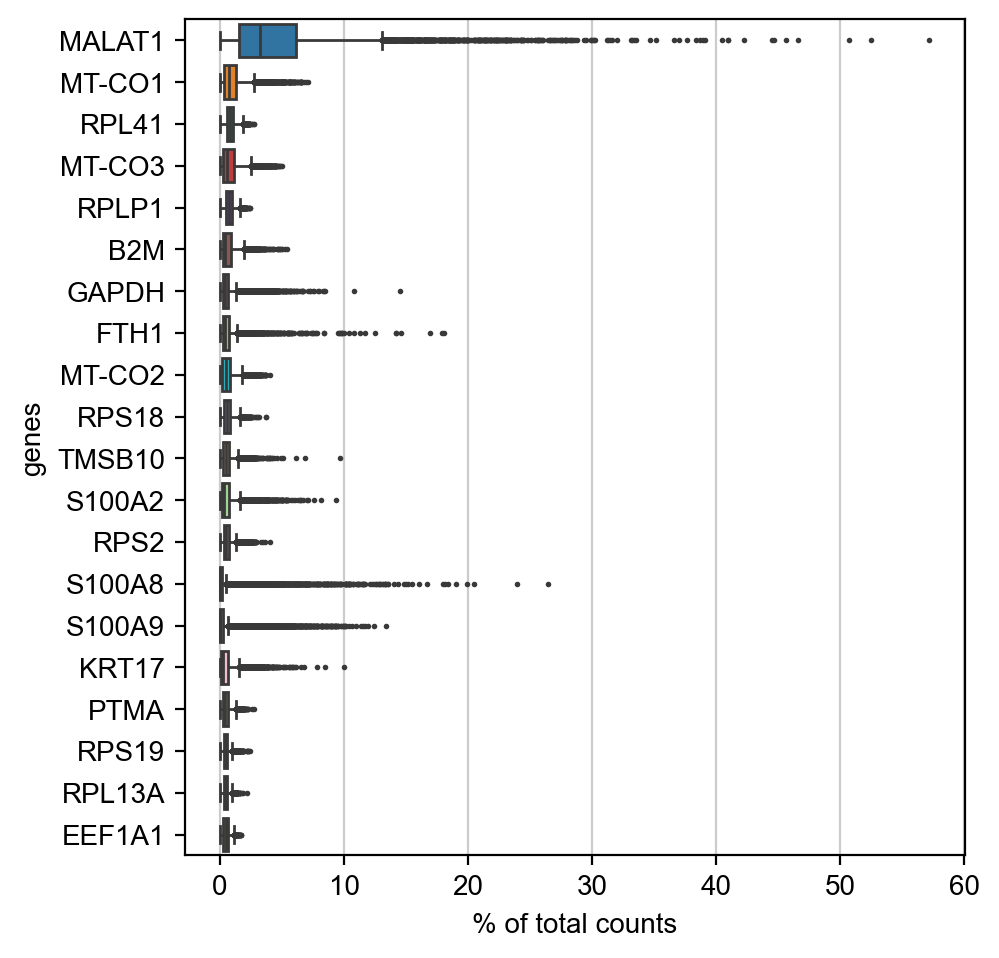

In [12]:
sc.pl.highest_expr_genes(adata, n_top=20, )

/tmp/ipykernel_3500916/3542297969.py:22: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


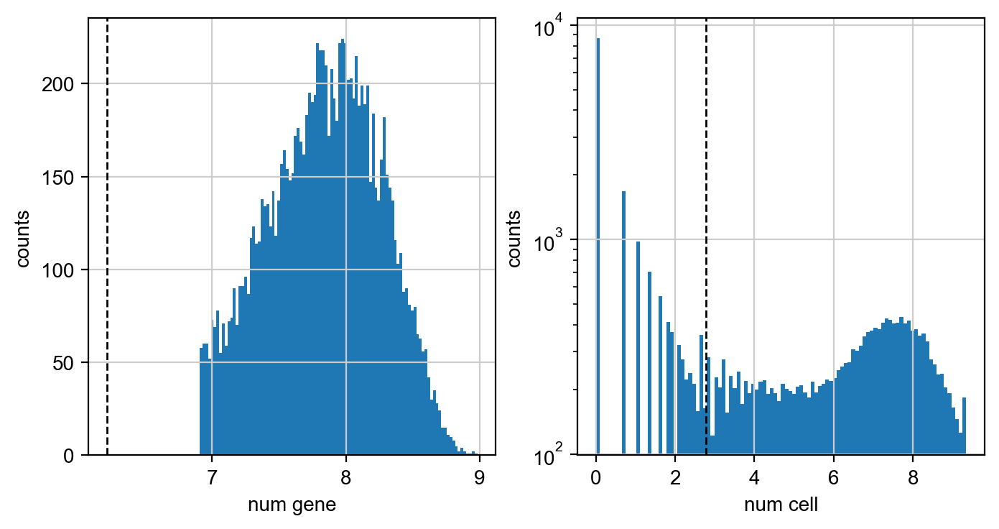

In [13]:
valX = adata.X>0
minGenes=500
minCells=15

fig, axs = plt.subplots(1, 2, figsize=(8, 4))

numCellwExp = valX.sum(axis=1)
axs[0].hist(np.log(numCellwExp), bins=100)#, log=True)
axs[0].axvline(np.log(minGenes), color='k', linestyle='dashed', linewidth=1)
axs[0].set_xlabel('num gene')
axs[0].set_ylabel('counts')

numGeneswExp = valX.sum(axis=0).T
axs[1].hist(np.log(numGeneswExp+1), bins=100, log=True)
axs[1].axvline(np.log(minCells+1), color='k', linestyle='dashed', linewidth=1)
#axs[0,1].axvline(np.log(600), color='k', linestyle='dashed', linewidth=1)
#axs[0,1].axvline(np.log(4000), color='k', linestyle='dashed', linewidth=1)
#axs[0,1].set_title('Gene means counts')
axs[1].set_xlabel('num cell')
axs[1].set_ylabel('counts')

fig.show()

In [14]:
sc.pp.filter_cells(adata, min_genes = minGenes)
sc.pp.filter_genes(adata, min_cells = minCells)

filtered out 15155 genes that are detected in less than 15 cells


In [15]:
adata = adata[:,np.logical_not(adata.var_names=="MALAT1")]

## Mito QC

In [16]:
for g in adata.var_names:
    if "MT-" == g[:2]:
        print(g)

In [17]:
adata.var['mt'] = adata.var_names.str.startswith('MT-') 
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], log1p = False, inplace=True)

/tmp/ipykernel_3500916/2933791377.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['mt'] = adata.var_names.str.startswith('MT-')


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


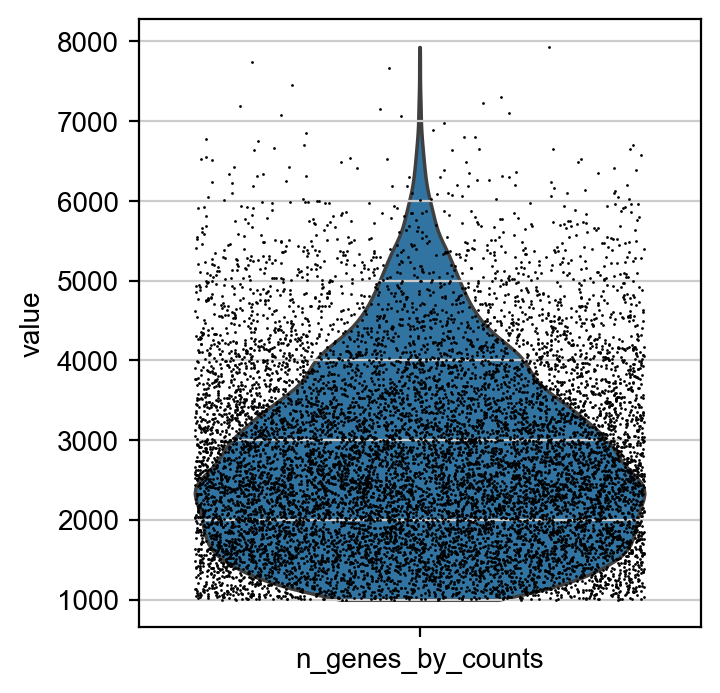

In [18]:
sc.pl.violin(adata, ['n_genes_by_counts'], jitter=0.4)

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


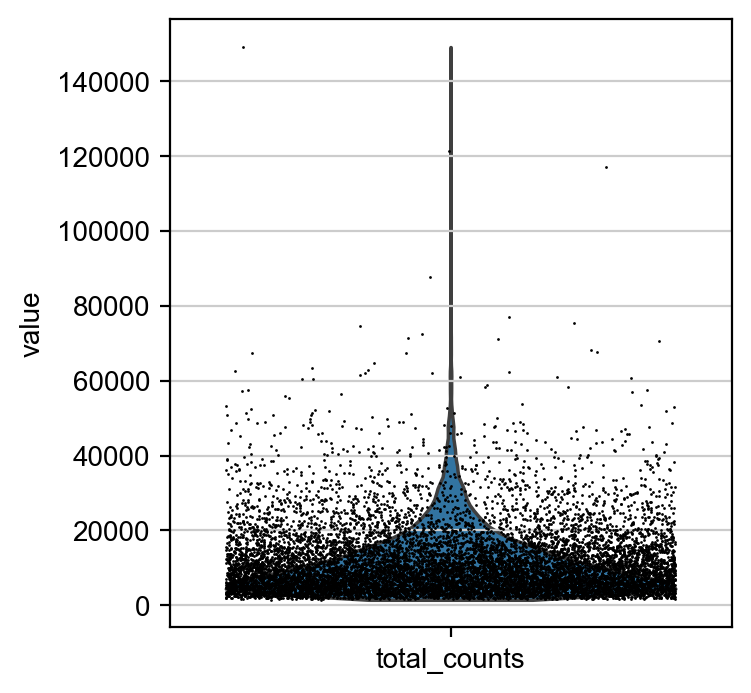

In [19]:
sc.pl.violin(adata, ['total_counts'], jitter=0.4)

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


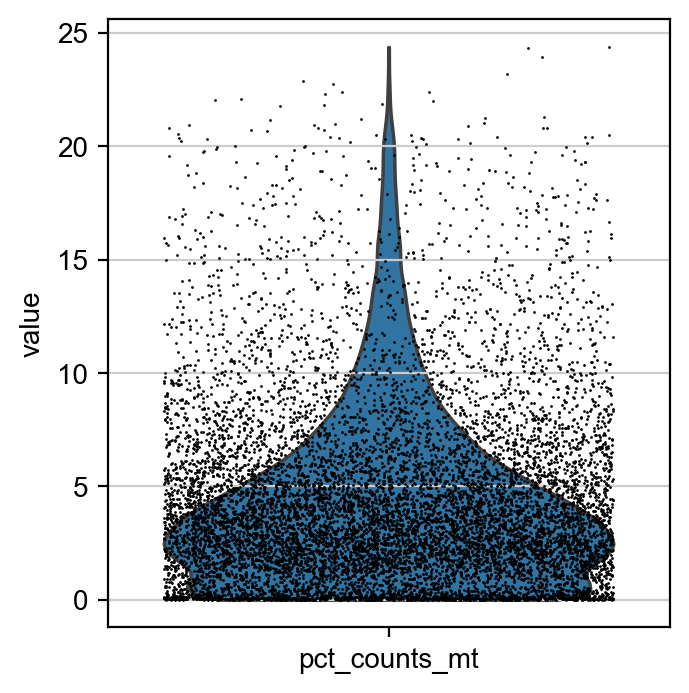

In [20]:
sc.pl.violin(adata, ['pct_counts_mt'], jitter=0.4)

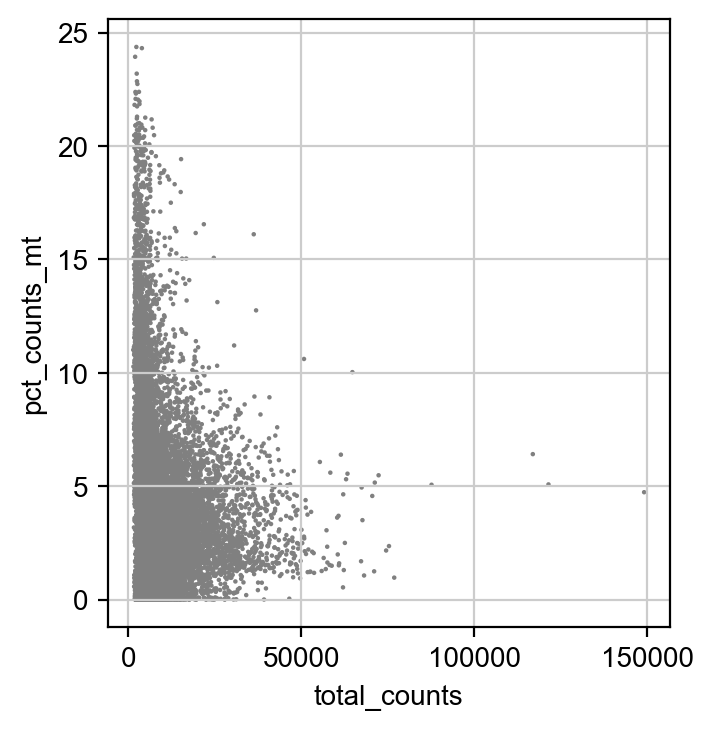

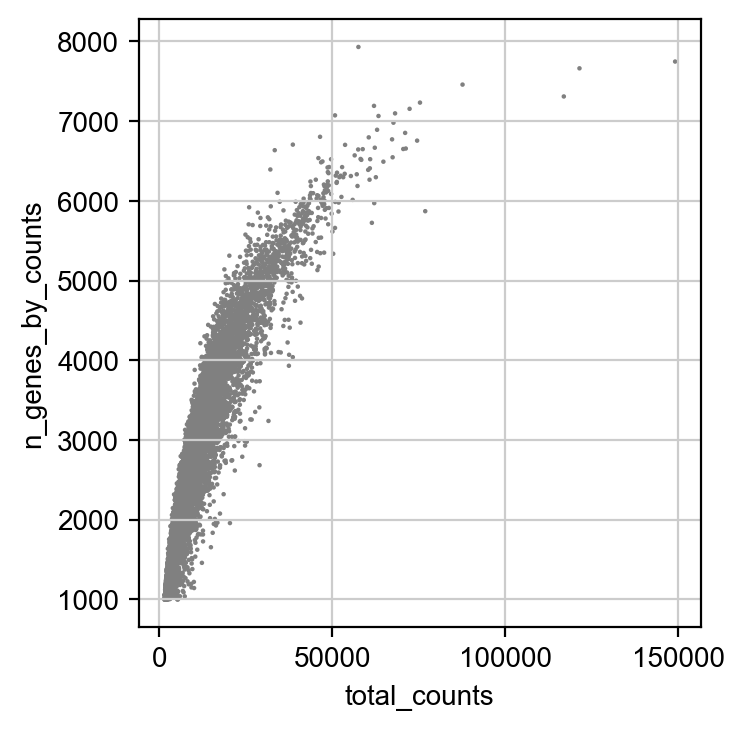

In [21]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

remove cells that have too much mito or could be doublets

In [22]:
adata = adata[adata.obs.n_genes_by_counts < 6000, :]
adata = adata[adata.obs.total_counts < 30000, :]
adata = adata[adata.obs.pct_counts_mt < 15, :]

save post QC scanpy

In [23]:
adata

View of AnnData object with n_obs × n_vars = 10566 × 18389
    obs: 'sample', 'patient', 'cell_type', 'cell_subtype', 'complexity', 'umap1', 'umap2', 'g1s_score', 'g2m_score', 'cell_cycle_phase', 'mp_top_score', 'mp_top', 'mp_assignment', 'hpv', 'hpv_score', 'n_genes', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [24]:
resultsFileQC

'write/Kürten2021_Head-and-Neck_QC.h5ad'

In [25]:
adata.write(resultsFileQC)

# Analysis

In [26]:
resultsFile = writeDir + fileName + '.h5ad'       # final output
resultsFileQC = writeDir + fileName + '_QC.h5ad'  # post QC (pre-analysis) 

Set figure parameters

In [27]:
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=150, fontsize=10, format='png')
sc.settings.figdir = "figures/" + fileName + "/"
figName = fileName

In [28]:
adata = sc.read(resultsFileQC)
adata

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 10566 × 18389
    obs: 'sample', 'patient', 'cell_type', 'cell_subtype', 'complexity', 'umap1', 'umap2', 'g1s_score', 'g2m_score', 'cell_cycle_phase', 'mp_top_score', 'mp_top', 'mp_assignment', 'hpv', 'hpv_score', 'n_genes', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [29]:
sc.pp.normalize_total(adata,target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [30]:
sc.pp.log1p(adata)

In [31]:
sc.pp.highly_variable_genes(adata)#, flavor = "seurat", n_top_genes=2000)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


1700


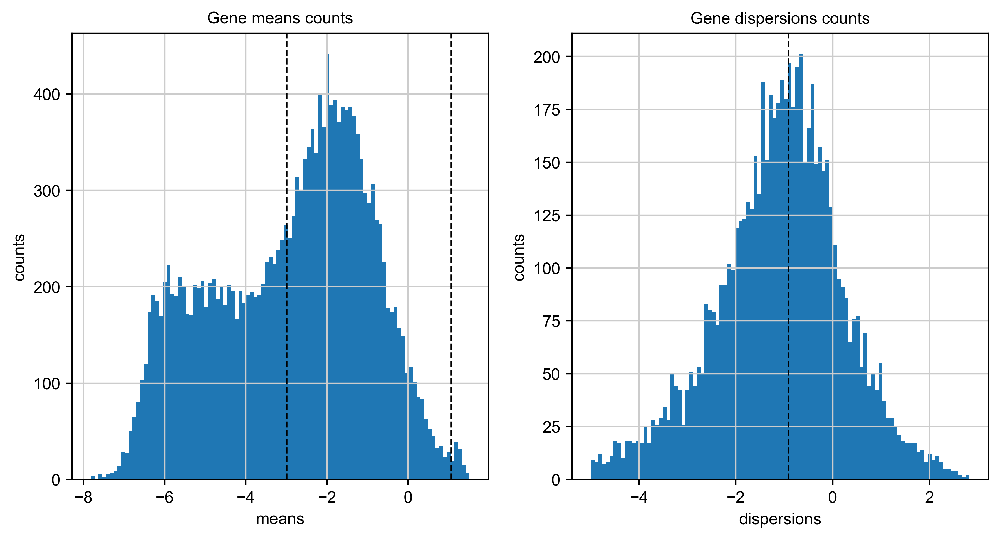

In [32]:
minMean = 0.05
maxMean = 2.9
minDisp = 0.4

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

means = adata.var[["means"]][adata.var[["means"]] > np.exp(-14)]#adata.var[["means"]],
axs[0].hist(np.log(means), bins=100)#, log=True),
axs[0].axvline(np.log(minMean), color='k', linestyle='dashed', linewidth=1)
axs[0].axvline(np.log(maxMean), color='k', linestyle='dashed', linewidth=1)
axs[0].set_title('Gene means counts')
axs[0].set_xlabel('means')
axs[0].set_ylabel('counts')

dispNorm = adata.var[["dispersions_norm"]][adata.var[["dispersions_norm"]] > np.exp(-5)]#adata.var[["means"]],
axs[1].hist(np.log(dispNorm), bins=100)#, log=True),
axs[1].axvline(np.log(minDisp), color='k', linestyle='dashed', linewidth=1)
axs[1].set_title('Gene dispersions counts')
axs[1].set_xlabel('dispersions')
axs[1].set_ylabel('counts')

sc.pp.highly_variable_genes(adata, min_disp=minDisp, min_mean=minMean, max_mean=maxMean)
print(sum(adata.var.highly_variable))

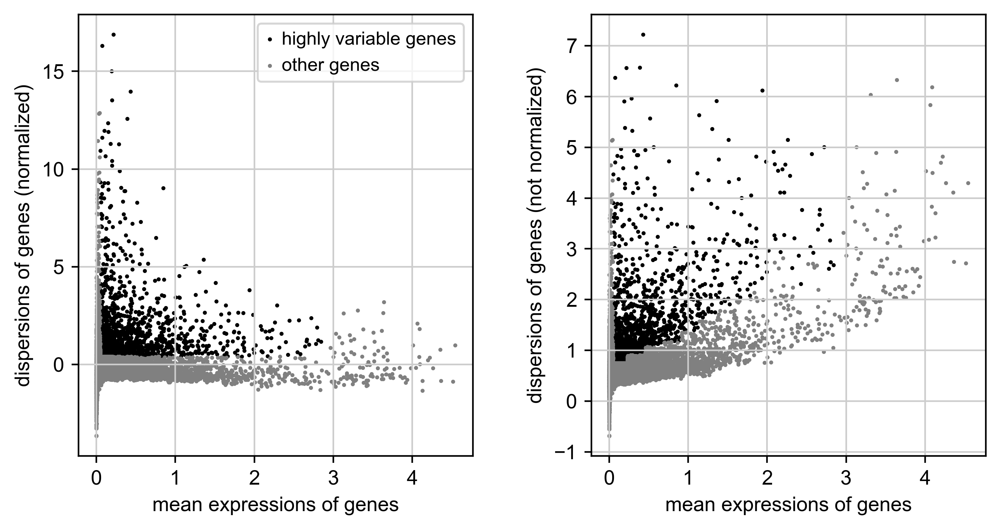

In [33]:
sc.pl.highly_variable_genes(adata)

In [34]:
#for inGene in adata.var[-8:].index.tolist():
#    adata.var.loc[inGene,"highly_variable"] = False

In [35]:
adata.raw = adata

In [36]:
#adata = adata[:, adata.var.highly_variable]
adata = adata[:, np.logical_and(adata.var.highly_variable, np.logical_not(adata.var.mt))]

In [37]:
#sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

In [38]:
#sc.pp.scale(adata, max_value=10)

In [39]:
sc.tl.pca(adata, n_comps = 100, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:01)


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca


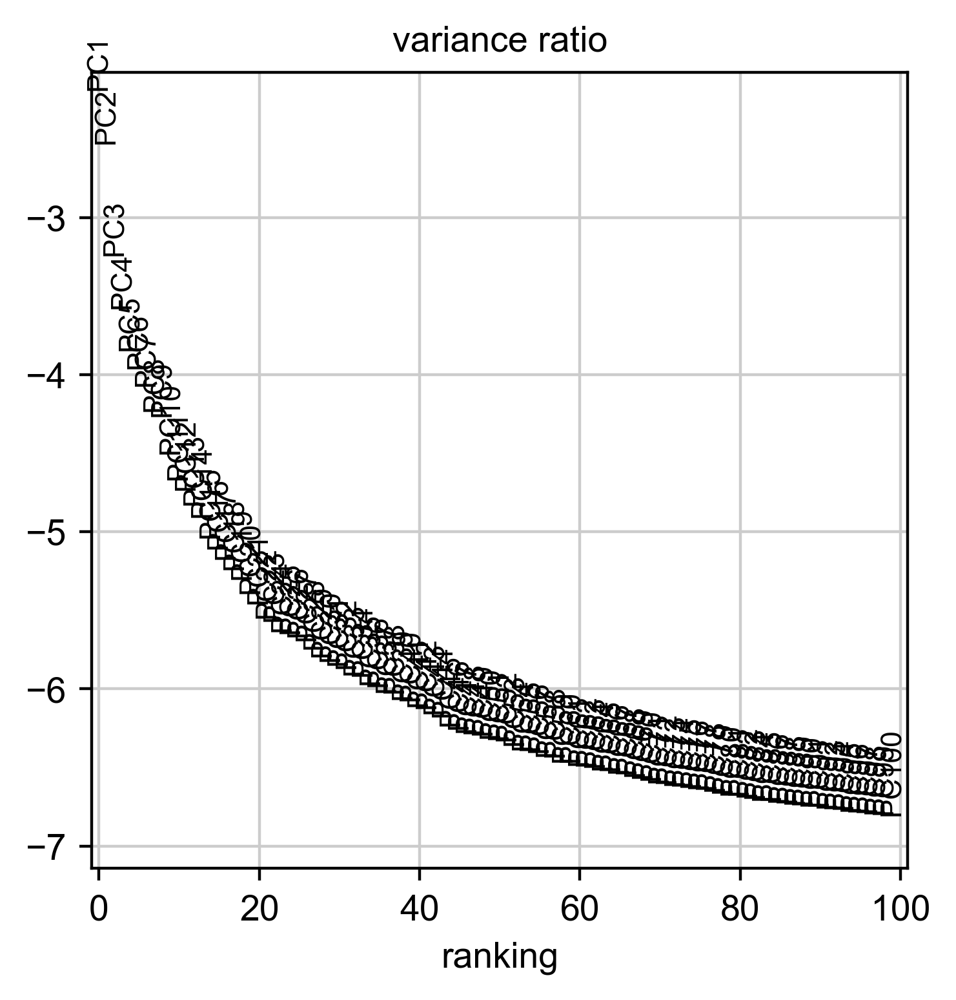

In [40]:
sc.pl.pca_variance_ratio(adata, n_pcs = 100, log=True)

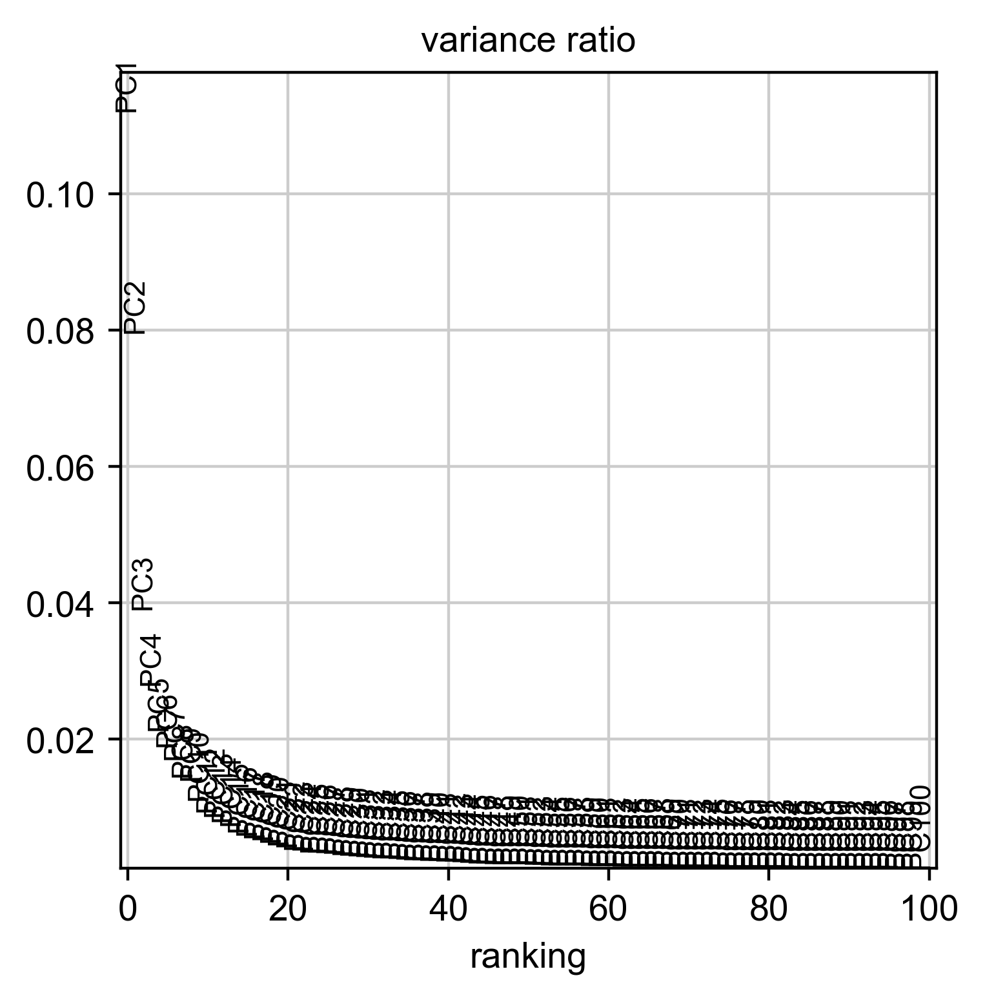

In [41]:
sc.pl.pca_variance_ratio(adata, n_pcs = 100)

In [42]:
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:15)


In [43]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


In [44]:
sc.tl.leiden(adata, resolution=0.1)

running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [45]:
adata.obs

,sample,patient,cell_type,cell_subtype,complexity,umap1,umap2,g1s_score,g2m_score,cell_cycle_phase,...,n_genes,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,pct_counts_mt,leiden
cell_name,,,,,,,,,,,,,,,,,,,,,
HN01_CD45p_ACACTGAAGGAGTTGC-1,GSM5017022_HN01_CD45p,HN01,Malignant,Epithelial,4776,-2.9430,-34.1444,0.4577,0.3204,Not cycling,...,4778,4770,28980.0,27.481021,41.149068,54.399586,68.533471,1075.0,3.709455,0
HN01_CD45p_ACTTGTTGTACGCACC-1,GSM5017022_HN01_CD45p,HN01,Malignant,Epithelial,2137,-7.3633,-32.2707,0.6989,0.5855,Not cycling,...,2139,2136,8161.0,27.802965,41.293959,56.243107,73.312094,102.0,1.249847,0
HN01_CD45p_CGGACGTAGCCTCGTG-1,GSM5017022_HN01_CD45p,HN01,Malignant,Epithelial,1733,-2.9413,-31.7623,-0.2728,-0.0981,Not cycling,...,1733,1731,3640.0,32.225275,40.219780,49.615385,66.181319,439.0,12.060440,0
HN01_CD45p_CGGAGTCTCAGGTAAA-1,GSM5017022_HN01_CD45p,HN01,Malignant,Epithelial,1175,-12.2996,-20.4565,-0.1833,-0.1248,Not cycling,...,1176,1176,2932.0,32.230559,45.259209,58.458390,76.944065,0.0,0.000000,0
HN01_CD45p_CGTCCATCATCTATGG-1,GSM5017022_HN01_CD45p,HN01,Malignant,Epithelial,1194,-3.1829,-32.0263,-0.3390,-0.1516,Not cycling,...,1194,1193,2073.0,28.027014,36.372407,47.467438,66.570188,0.0,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HN18_CD45n_TTGGAACCAGACGCAA-1,GSM5017071_HN18_CD45n,HN18,Malignant,Epithelial,3395,-18.3541,4.5888,-0.2109,0.0341,Not cycling,...,3396,3382,12371.0,28.000970,38.509417,50.092959,64.618867,413.0,3.338453,2
HN18_CD45n_TTGGAACTCGGTCCGA-1,GSM5017071_HN18_CD45n,HN18,Malignant,Epithelial,1958,-18.1675,4.6796,0.2422,-0.0083,Not cycling,...,1959,1954,4927.0,26.304039,37.345241,49.482444,66.023950,113.0,2.293485,2
HN18_CD45n_TTGTAGGAGACGCACA-1,GSM5017071_HN18_CD45n,HN18,Malignant,Epithelial,2043,-16.9988,4.2062,-0.1810,-0.1321,Not cycling,...,2045,2042,5583.0,28.550958,38.706788,50.797063,67.848827,103.0,1.844886,2


In [46]:
meta

,patient,n_cells,technology,cancer_type,sex,age,smoking_status,PY,diagnosis_recurrence,disease_extent,...,targeted_rx_response,ICB_exposed,ICB_response,ET_exposed,ET_response,time_end_of_rx_to_sampling,post_sampling_rx_exposed,post_sampling_rx_response,PFS_DFS,OS
sample,,,,,,,,,,,,,,,,,,,,,
GSM5017022_HN01_CD45p,HN01,2168,10X,Head and Neck Squamous Cell Carcinoma,M,70-79,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017023_HN01_CD45n,HN01,4174,10X,Head and Neck Squamous Cell Carcinoma,M,70-79,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017025_HN02_CD45p,HN02,474,10X,Head and Neck Squamous Cell Carcinoma,F,60-69,NO,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017027_HN03_CD45p,HN03,654,10X,Head and Neck Squamous Cell Carcinoma,M,80-89,NO,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017029_HN04_CD45p,HN04,654,10X,Head and Neck Squamous Cell Carcinoma,M,50-59,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017031_HN05_CD45p,HN05,1398,10X,Head and Neck Squamous Cell Carcinoma,F,50-59,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017032_HN05_CD45n,HN05,971,10X,Head and Neck Squamous Cell Carcinoma,F,50-59,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017034_HN06_CD45p,HN06,1543,10X,Head and Neck Squamous Cell Carcinoma,M,30-39,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN
GSM5017035_HN06_CD45n,HN06,780,10X,Head and Neck Squamous Cell Carcinoma,M,30-39,YES,NaN,diagnosis,NaN,...,not exposed,not exposed,not exposed,not exposed,not exposed,NaN,NaN,NaN,NaN,NaN


In [61]:
adata.obs["patient"] = pd.Categorical([str(s).split("_")[1] for s in adata.obs["sample"]])

In [62]:
#adata.obs["diagnosis"] = [meta.loc[s].diagnosis_recurrence for s in adata.obs["sample"]]
adata.obs["cancerType"] = [meta.loc[s].cancer_type for s in adata.obs["sample"]]
adata.obs["sex"] = [meta.loc[s].sex for s in adata.obs["sample"]]
#adata.obs["site"] = [meta.loc[s].site for s in adata.obs["sample"]]

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

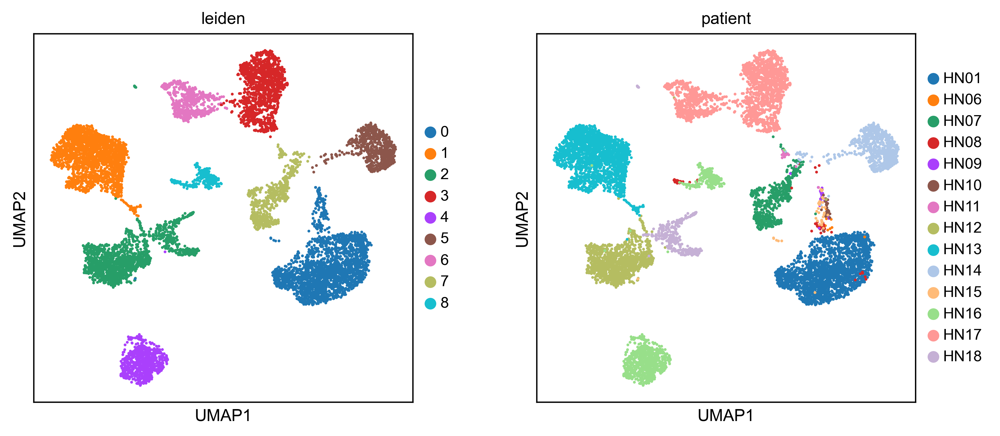

In [63]:
sc.pl.umap(adata, color=["leiden","patient"],ncols=4)

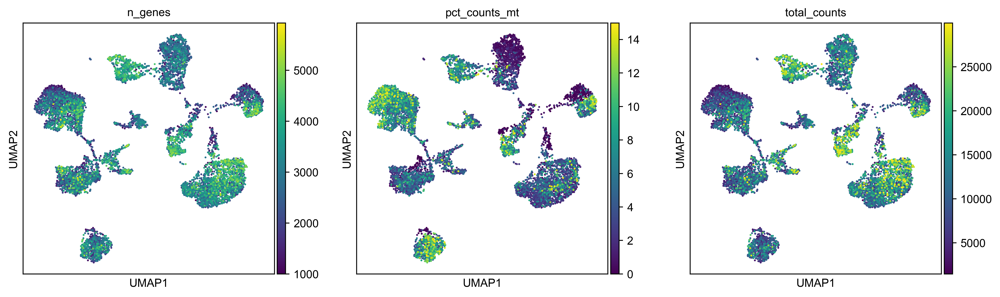

In [51]:
sc.pl.umap(adata, color=["n_genes","pct_counts_mt","total_counts"])

ranking genes


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


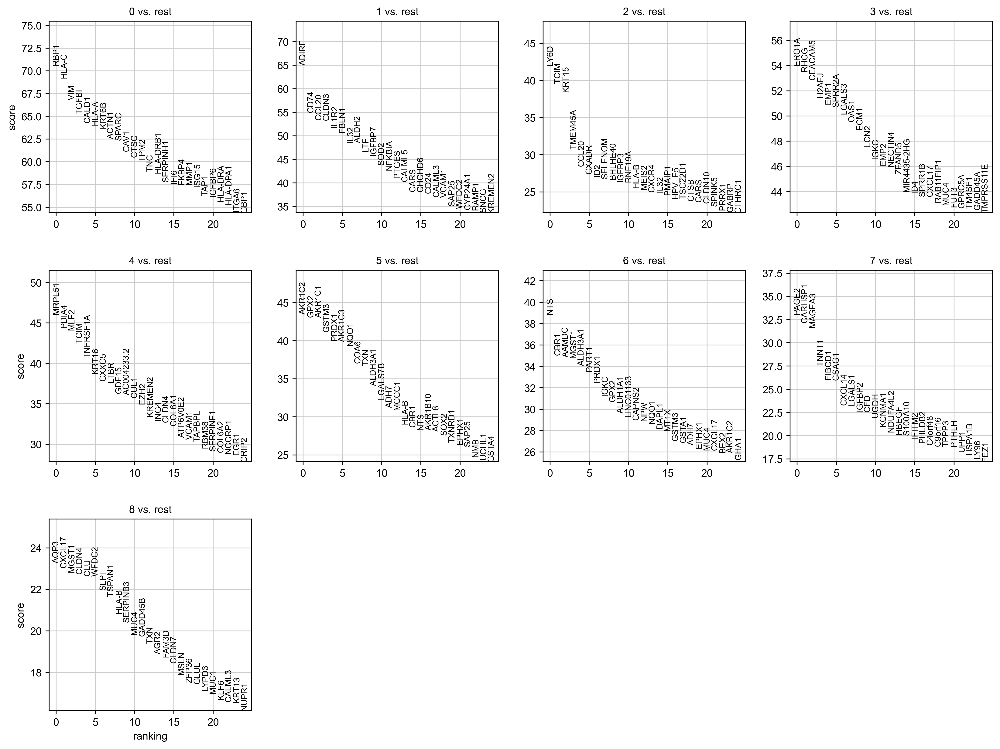

In [52]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', use_raw=False)
#sc.tl.filter_rank_genes_groups(adata, groupby="leiden", use_raw=False,
#                                   key_added='rank_genes_groups_filtered', 
#                                   min_in_group_fraction=0.25, min_fold_change=1, max_out_group_fraction=0.5, compare_abs=False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [53]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(15)

,0,1,2,3,4,5,6,7,8
0,RBP1,ADIRF,LY6D,ERO1A,MRPL51,AKR1C2,NTS,PAGE2,AQP3
1,HLA-C,CD74,TCIM,RHCG,PDIA4,GPX2,CBR1,CARHSP1,CXCL17
2,VIM,CCL20,KRT15,CEACAM5,MLF2,AKR1C1,AAMDC,MAGEA3,MGST1
3,TGFBI,CLDN3,TMEM45A,H2AFJ,TCIM,GSTM3,MGST1,TNNT1,CLDN4
4,CALD1,IL1R2,CCL20,EMP1,TNFRSF1A,PRDX1,ALDH3A1,FIBCD1,CLU
5,HLA-A,FBLN1,CXADR,SPRR2A,KRT16,AKR1C3,PART1,CSAG1,WFDC2
6,KRT6B,IL32,ID2,LGALS3,CXXC5,NQO1,PRDX1,CXCL14,SLPI
7,ACTN1,ALDH2,SELENOM,OAS1,LTBR,COA6,IGKC,LGALS1,TSPAN1
8,SPARC,LTF,BHLHE40,ECM1,GDF15,TXN,GPX2,IGFBP2,HLA-B
9,CAV1,IGFBP7,IGFBP3,LCN2,AC004233.2,ALDH3A1,ALDH1A1,CFD,SERPINB3


    using 'X_pca' with n_pcs = 40
Storing dendrogram info using `.uns['dendrogram_leiden']`


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/tools/_dendrogram.py:133: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_df = rep_df.groupby(level=0).mean()
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/get/get.py:66: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/get/get.py:66: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What

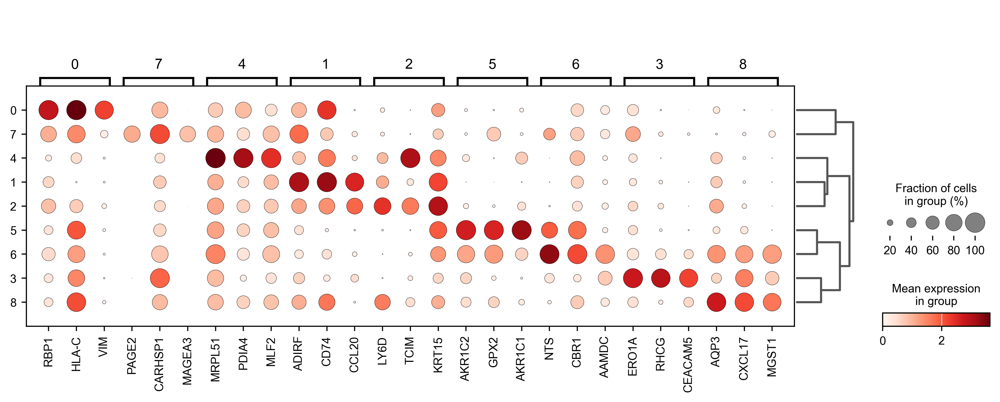

In [54]:
sc.tl.dendrogram(adata,groupby="leiden", n_pcs=40)
sc.pl.rank_genes_groups_dotplot(adata,n_genes=3)#,key="rank_genes_groups_filtered")

In [55]:
sigFile = "../mhCompTiss/data/LUAD/humanLUADgeneSig.csv"
sigGenes = pd.read_csv(sigFile)
hpcs = sigGenes["hpcs"]

In [56]:
sc.tl.score_genes(adata, hpcs, score_name="HPCS_score")

computing score 'HPCS_score'
    finished: added
    'HPCS_score', score of gene set (adata.obs).
    1085 total control genes are used. (0:00:00)


/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

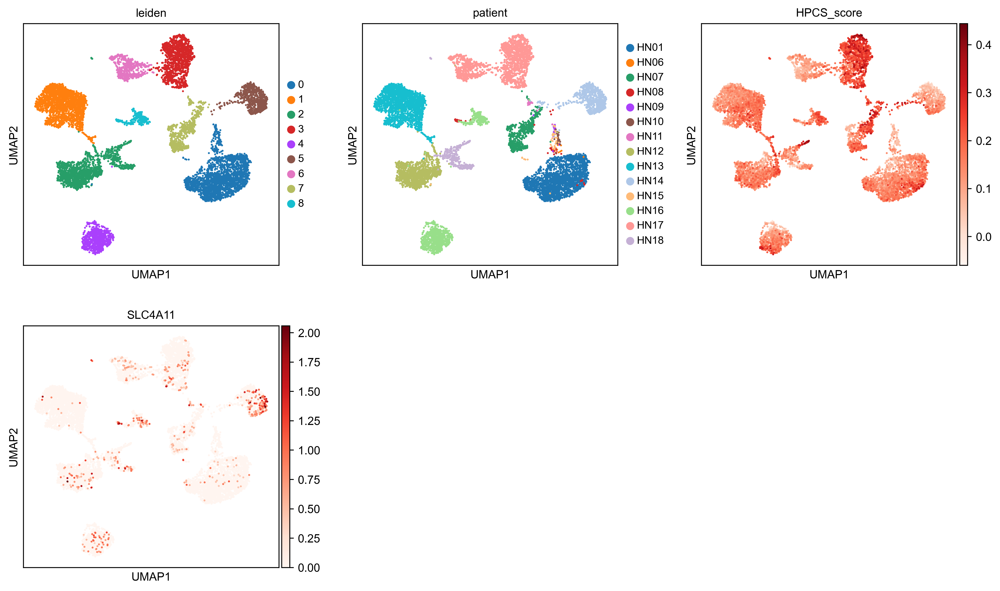

In [64]:
sc.pl.umap(adata, color=["leiden","patient","HPCS_score","SLC4A11"],ncols=3, cmap="Reds")

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

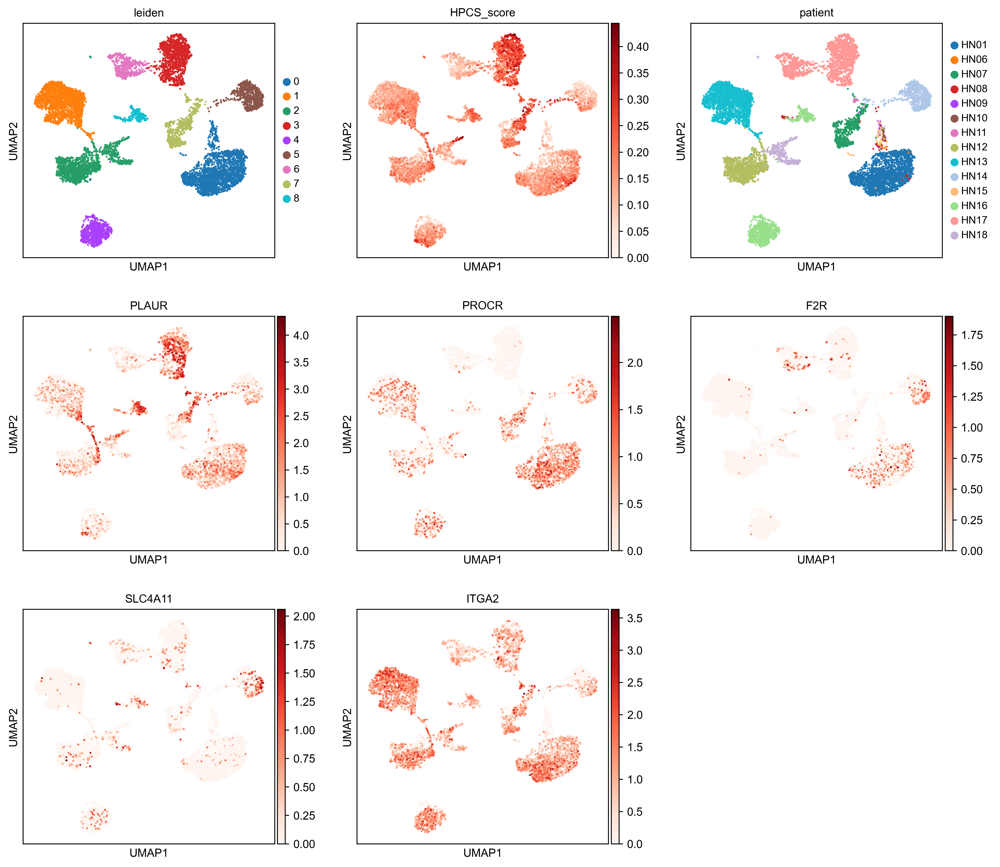

In [65]:
sc.pl.umap(adata, color=["leiden","HPCS_score","patient","PLAUR", "PROCR", "F2R", "SLC4A11", "ITGA2"],ncols=3, cmap="Reds", vmin=0)

In [66]:
resultsFile

'write/Kürten2021_Head-and-Neck.h5ad'

In [67]:
adata.write(resultsFile)
adata

AnnData object with n_obs × n_vars = 10566 × 1699
    obs: 'sample', 'patient', 'cell_type', 'cell_subtype', 'complexity', 'umap1', 'umap2', 'g1s_score', 'g2m_score', 'cell_cycle_phase', 'mp_top_score', 'mp_top', 'mp_assignment', 'hpv', 'hpv_score', 'n_genes', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cancerType', 'HPCS_score', 'sex'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'patient_colors', 'rank_genes_groups', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

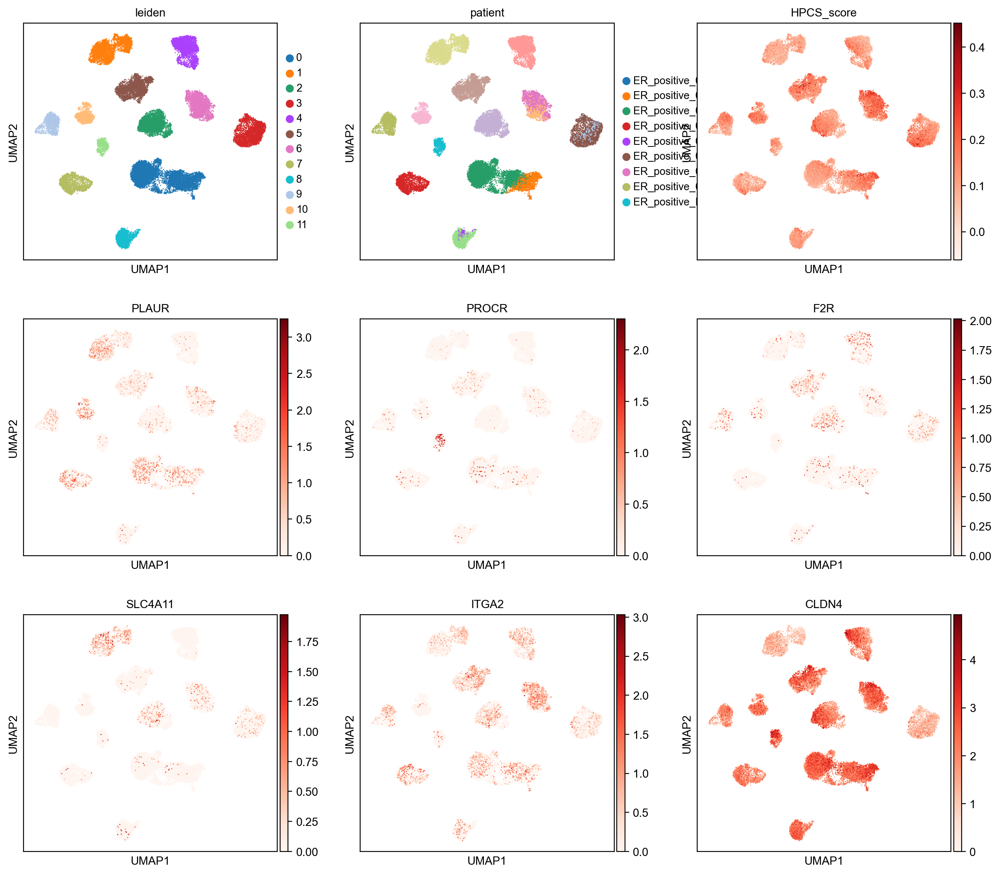

In [70]:
import scanpy as sc
writeDir = "write/"
fileName = ""
resultsFile = writeDir + fileName + '.h5ad' 
adata = sc.read_h5ad(resultsFile)
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=150, fontsize=10, format='png')
sc.pl.umap(adata, color=["leiden","patient","HPCS_score","PLAUR", "PROCR", "F2R", "SLC4A11", "ITGA2", "CLDN4"],ncols=3, cmap="Reds")


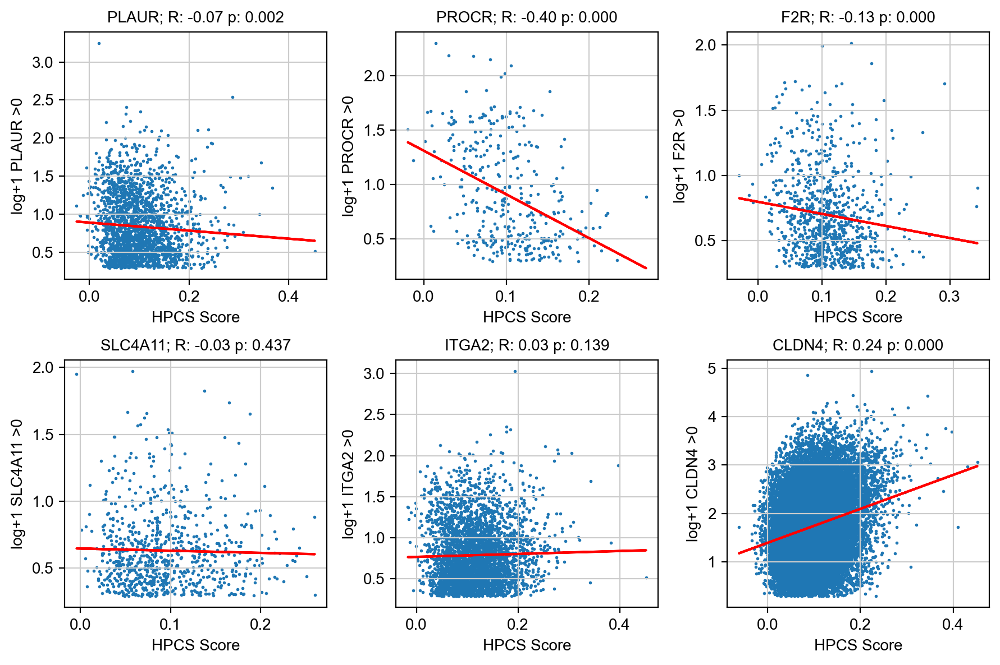

In [71]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import linregress

adatar = adata.raw.to_adata()

def plotExpvScore(gene, ax):
    geneExpr = np.array(adatar[:,adatar.var_names==gene].X.todense().flatten())[0]
    
    x = adata.obs.HPCS_score.values[geneExpr>0]
    y = geneExpr[geneExpr>0]
    
    # Fit linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    #print(slope, intercept, r_value, p_value, std_err)
    
    # Calculate confidence interval
    confidence_interval = 1.96 * std_err  # 95% confidence interval
    
    # Create scatter plot
    ax.scatter(x, y, label="Data points", s=1)
    
    # Plot regression line
    ax.plot(x, slope * x + intercept, color='red', label="Regression line")
    
    ## Plot confidence interval
    #ax.fill_between(x, slope * x + intercept - confidence_interval, slope * x + intercept + confidence_interval, color='blue', alpha=0.3, label="Confidence interval")
    
    # Add labels and title
    ax.set_title(f"{gene}; R: {r_value:.2f} p: {p_value:.3f}")
    ax.set_xlabel("HPCS Score")
    ax.set_ylabel(f"log+1 {gene} >0")

    return(r_value)

genes = ["PLAUR", "PROCR", "F2R", "SLC4A11", "ITGA2", "CLDN4"]
rvals = np.zeros(len(genes))
fig, axs = plt.subplots(2,3, figsize=(9,6))

for i,ax in enumerate(axs.flatten()):
    rvals[i] = plotExpvScore(genes[i], ax)

fig.tight_layout()

pd.DataFrame(rvals, index=genes, columns=[fileName]).to_csv(f"{writeDir}/hpcsCorr/{fileName}_GeneRs.csv")